![NYC Skyline](nyc.jpg)

Welcome to New York City, one of the most-visited cities in the world. There are many Airbnb listings in New York City to meet the high demand for temporary lodging for travelers, which can be anywhere between a few nights to many months. In this project, we will take a closer look at the New York Airbnb market by combining data from multiple file types like `.csv`, `.tsv`, and `.xlsx`.

Recall that **CSV**, **TSV**, and **Excel** files are three common formats for storing data. 
Three files containing data on 2019 Airbnb listings are available to you:

**data/airbnb_price.csv**
This is a CSV file containing data on Airbnb listing prices and locations.
- **`listing_id`**: unique identifier of listing
- **`price`**: nightly listing price in USD
- **`nbhood_full`**: name of borough and neighborhood where listing is located

**data/airbnb_room_type.xlsx**
This is an Excel file containing data on Airbnb listing descriptions and room types.
- **`listing_id`**: unique identifier of listing
- **`description`**: listing description
- **`room_type`**: Airbnb has three types of rooms: shared rooms, private rooms, and entire homes/apartments

**data/airbnb_last_review.tsv**
This is a TSV file containing data on Airbnb host names and review dates.
- **`listing_id`**: unique identifier of listing
- **`host_name`**: name of listing host
- **`last_review`**: date when the listing was last reviewed

In [1]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Begin coding here ...
# Use as many cells as you like

In [2]:
df_price = pd.read_csv(r'C:\Users\Tajirz international\OneDrive\Desktop\EDA-Project\EDA-Project-Airbnb-Market-Trends\data\airbnb_price.csv')
df_price

,listing_id,price,nbhood_full
0,2595,225 dollars,"Manhattan, Midtown"
1,3831,89 dollars,"Brooklyn, Clinton Hill"
2,5099,200 dollars,"Manhattan, Murray Hill"
3,5178,79 dollars,"Manhattan, Hell's Kitchen"
4,5238,150 dollars,"Manhattan, Chinatown"
...,...,...,...
25204,36425863,129 dollars,"Manhattan, Upper East Side"
25205,36427429,45 dollars,"Queens, Flushing"
25206,36438336,235 dollars,"Staten Island, Great Kills"
25207,36442252,100 dollars,"Bronx, Mott Haven"


In [3]:
df_review = pd.read_csv(r"C:\Users\Tajirz international\OneDrive\Desktop\EDA-Project\EDA-Project-Airbnb-Market-Trends\data\airbnb_last_review.tsv", delimiter="\t")
df_review

,listing_id,host_name,last_review
0,2595,Jennifer,May 21 2019
1,3831,LisaRoxanne,July 05 2019
2,5099,Chris,June 22 2019
3,5178,Shunichi,June 24 2019
4,5238,Ben,June 09 2019
...,...,...,...
25204,36425863,Rusaa,July 07 2019
25205,36427429,H Ai,July 07 2019
25206,36438336,Ben,July 07 2019
25207,36442252,Blaine,July 07 2019


In [4]:
df_room = pd.read_excel(r'C:\Users\Tajirz international\OneDrive\Desktop\EDA-Project\EDA-Project-Airbnb-Market-Trends\data\airbnb_room_type.xlsx')
df_room

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,Entire home/apt
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt
...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM
25205,36427429,No.2 with queen size bed,PRIVATE ROOM
25206,36438336,Seas The Moment,Private room
25207,36442252,1B-1B apartment near by Metro,Entire home/apt


In [5]:
#Basic Analysis
#1. dates of review
first_reviewd = df_review['last_review'].min()
last_reviewd = df_review['last_review'].max()
print(first_reviewd)
print(last_reviewd)

April 01 2019
May 31 2019


In [6]:
#2.private room listing
nb_private_rooms =  df_room['room_type'].value_counts()['private room']
nb_private_rooms

2248

In [7]:
df_price['price'] = df_price['price'].str.extract(r'(\d+)')
df_price['price'] = pd.to_numeric(df_price['price'], errors='coerce')

In [8]:
#3.Average price Calculation



avg_price = df_price['price'].mean()
avg_price



141.7779364512674

In [9]:
#4.Summary table
review_dates = pd.DataFrame({
    'first_reviewd' : [first_reviewd],
    'last_reviewd' : [last_reviewd],
    'nb_private_rooms' : [nb_private_rooms],
    'avg_price' : [avg_price]
    
})


In [10]:
review_dates

,first_reviewd,last_reviewd,nb_private_rooms,avg_price
0,April 01 2019,May 31 2019,2248,141.777936


In [11]:
#Intermediate alnalysis
#5.Neighbourhood trends

neighbourhood = df_price.nlargest(5,'price')

In [12]:
neighbourhood

,listing_id,price,nbhood_full
23916,34895693,7500,"Brooklyn, East Flatbush"
22085,33397385,5100,"Manhattan, Midtown"
18430,30035166,5000,"Manhattan, Harlem"
21731,33029434,3613,"Manhattan, Upper West Side"
12508,22263855,3000,"Manhattan, SoHo"


In [13]:
average_prices = neighbourhood.groupby('nbhood_full')['price'].mean().reset_index()
neighbourhood = neighbourhood.merge(average_prices, on = 'nbhood_full')
neighbourhood

,listing_id,price_x,nbhood_full,price_y
0,34895693,7500,"Brooklyn, East Flatbush",7500.0
1,33397385,5100,"Manhattan, Midtown",5100.0
2,30035166,5000,"Manhattan, Harlem",5000.0
3,33029434,3613,"Manhattan, Upper West Side",3613.0
4,22263855,3000,"Manhattan, SoHo",3000.0


In [14]:
#6 word analysis

from collections import Counter
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS


In [15]:
all_words = df_room['description'].str.lower().str.split().explode()

In [16]:
filtered_words = [
    word for word in all_words
    if isinstance(word, str) and word not in ENGLISH_STOP_WORDS and word.isalpha()
]

In [17]:
count = Counter(filtered_words)

In [18]:
common_words = count.most_common(10)
common_words

[('room', 4762),
 ('private', 3974),
 ('bedroom', 3468),
 ('apartment', 2952),
 ('cozy', 2556),
 ('brooklyn', 1933),
 ('studio', 1848),
 ('apt', 1731),
 ('manhattan', 1673),
 ('spacious', 1560)]

In [19]:
#advance analysis
#7.
df_room

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,Entire home/apt
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt
...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM
25205,36427429,No.2 with queen size bed,PRIVATE ROOM
25206,36438336,Seas The Moment,Private room
25207,36442252,1B-1B apartment near by Metro,Entire home/apt


In [20]:
merged= df_room.merge(df_price, how = 'outer' )

In [21]:
merged

,listing_id,description,room_type,price,nbhood_full
0,2595,Skylit Midtown Castle,Entire home/apt,225,"Manhattan, Midtown"
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt,89,"Brooklyn, Clinton Hill"
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt,200,"Manhattan, Murray Hill"
3,5178,Large Furnished Room Near B'way,private room,79,"Manhattan, Hell's Kitchen"
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt,150,"Manhattan, Chinatown"
...,...,...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM,129,"Manhattan, Upper East Side"
25205,36427429,No.2 with queen size bed,PRIVATE ROOM,45,"Queens, Flushing"
25206,36438336,Seas The Moment,Private room,235,"Staten Island, Great Kills"
25207,36442252,1B-1B apartment near by Metro,Entire home/apt,100,"Bronx, Mott Haven"


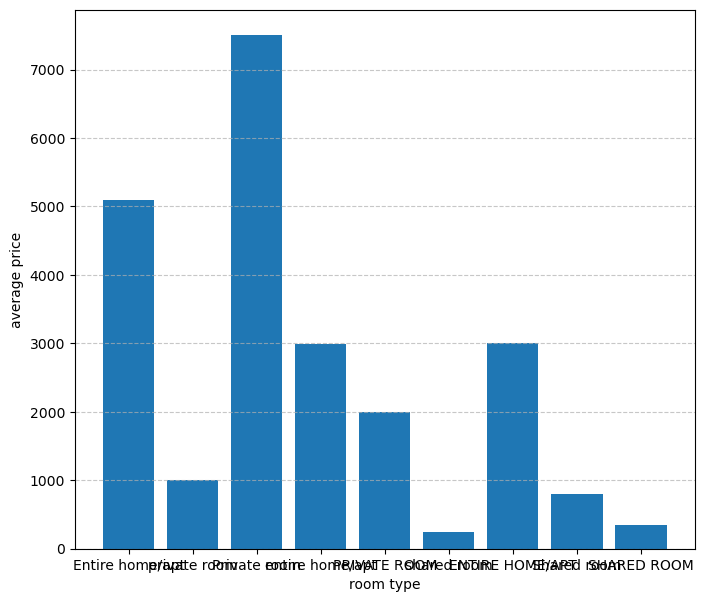

In [22]:
plt.figure(figsize=(8,7))
plt.bar(merged['room_type'], merged['price'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xlabel('room type')
plt.ylabel('average price')
plt.show()

In [23]:
#8. trend over time
df_review['review_date'] = pd.to_datetime(df_review['last_review'])
df_review['Month'] = df_review['review_date'].dt.to_period('M')
review_by_month = df_review.groupby('Month').size()
review_by_month

Month
2019-01     1440
2019-02      470
2019-03      820
2019-04     1456
2019-05     3697
2019-06    12601
2019-07     4725
Freq: M, dtype: int64

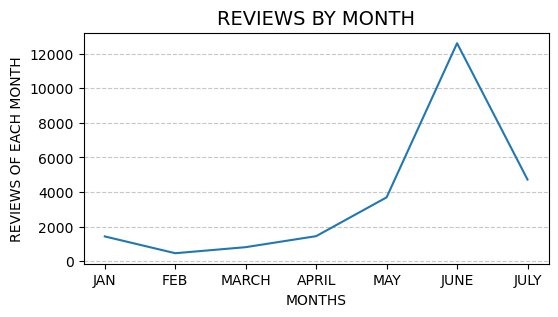

In [24]:
months=["JAN","FEB","MARCH","APRIL","MAY","JUNE","JULY"]
reviews=[1440,470,820,1456,3697,12601,4725]
plt.figure(figsize=(6,3))
plt.plot(months,reviews)
plt.title('REVIEWS BY MONTH', fontsize=14)
plt.xlabel('MONTHS')
plt.ylabel('REVIEWS OF EACH MONTH')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [27]:
#9.
df_room['description_length'] = df_room['description'].str.len()
data=pd.DataFrame({'price':df_price['price'],
                  'description_len':df_room['description_length']})
data

,price,description_len
0,225,21.0
1,89,31.0
2,200,41.0
3,79,31.0
4,150,34.0
...,...,...
25204,129,42.0
25205,45,24.0
25206,235,15.0
25207,100,29.0


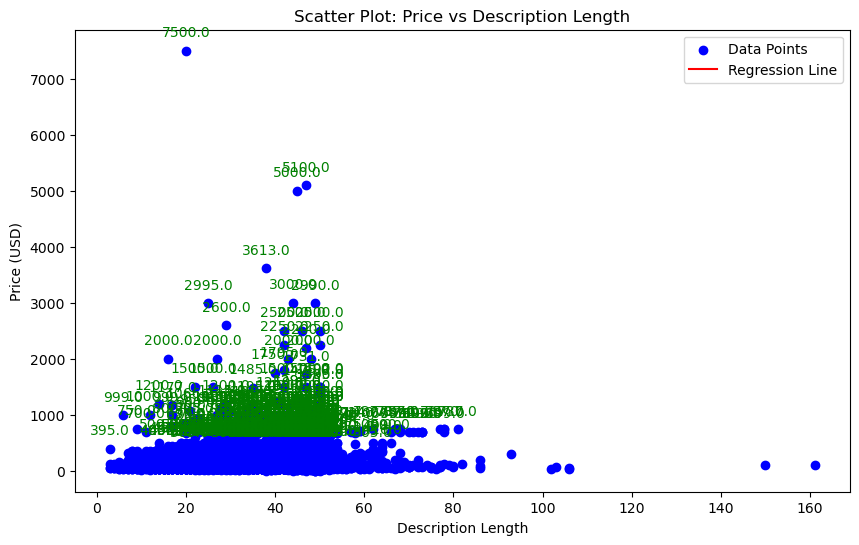

In [28]:
x = data['description_len']
y =data['price']
from scipy.stats import linregress
# Regression Line
slope, intercept, *_ = linregress(x, y)
regression_line = slope * x + intercept
plt.figure(figsize=(10, 6))
plt.scatter(x, y, label="Data Points", color="blue")
plt.plot(x, regression_line, label="Regression Line", color="red")

# Step 3: Highlight Outliers
mean_price = y.mean()
std_price = y.std()

# Define outliers (more than 1.5 std from the mean)
outliers = data[(y > mean_price + 1.5 * std_price) | (y < mean_price - 1.5 * std_price)]

# Annotate outliers
for _, row in outliers.iterrows():
    plt.annotate(f"{row['price']}", (row['description_len'], row['price']), 
                 textcoords="offset points", xytext=(0, 10), ha='center', color="green")

# Final Plot Settings
plt.xlabel("Description Length")
plt.ylabel("Price (USD)")
plt.title("Scatter Plot: Price vs Description Length")
plt.legend()
plt.show()

C:\Users\Tajirz international\AppData\Local\Temp\ipykernel_1588\1180106493.py:19: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


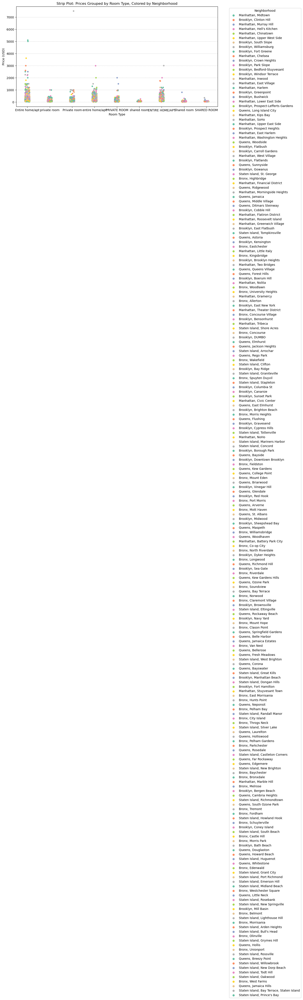

In [29]:
#10.
df=pd.DataFrame({'price':df_price['price'],
                'nbhood':df_price['nbhood_full'],
                'room_type':df_room['room_type']})
plt.figure(figsize=(12, 6))
sns.stripplot(
    data=df,
    x='room_type',
    y='price',
    hue='nbhood',   # Use hue to distinguish neighborhoods
    jitter=True,         # Add jitter to avoid overlapping
    palette='Set2'       # Use a predefined color palette
)
plt.title("Strip Plot: Prices Grouped by Room Type, Colored by Neighborhood")
plt.xlabel("Room Type")
plt.ylabel("Price (USD)")
plt.legend(title="Neighborhood", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

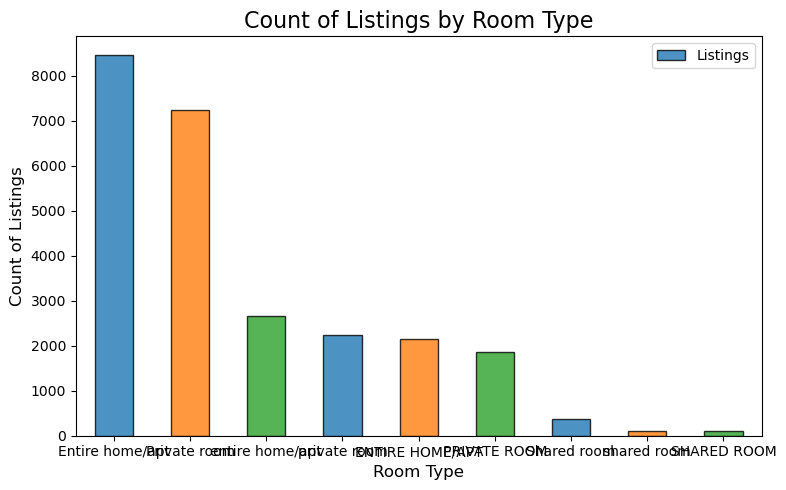

In [32]:
#Visualization questions
#11.
room_type = df_room['room_type'].value_counts()
plt.figure(figsize=(8, 5))
room_type.plot(kind='bar', color=['#1f77b4', '#ff7f0e', '#2ca02c'], alpha=0.8, edgecolor='black')
plt.title('Count of Listings by Room Type', fontsize=16)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Count of Listings', fontsize=12)
plt.xticks(rotation=0)  
plt.legend(['Listings'], loc='upper right')
plt.tight_layout()
plt.show()

In [33]:
#12.
df_review['review_count'] = df_review.groupby('listing_id')['last_review'].transform('count')
data=df_review[['listing_id', 'review_count']]
df=pd.DataFrame(data)
print(df)




       listing_id  review_count
0            2595             1
1            3831             1
2            5099             1
3            5178             1
4            5238             1
...           ...           ...
25204    36425863             1
25205    36427429             1
25206    36438336             1
25207    36442252             1
25208    36455809             1

[25209 rows x 2 columns]


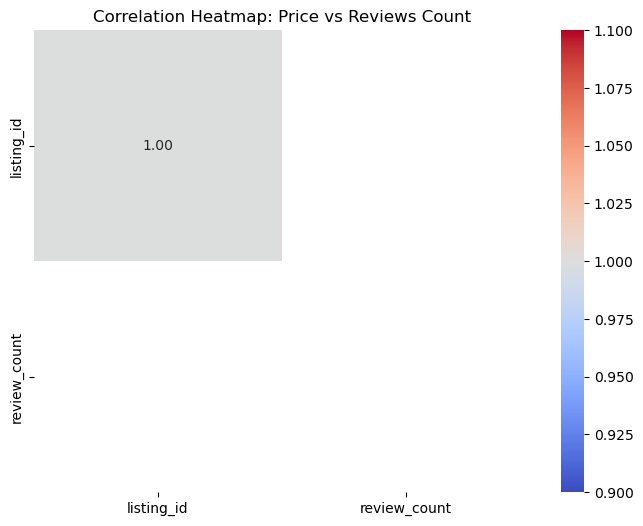

In [34]:
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,      
    cmap="coolwarm",
    fmt=".2f",       
    cbar=True       
)

plt.title("Correlation Heatmap: Price vs Reviews Count")
plt.show()

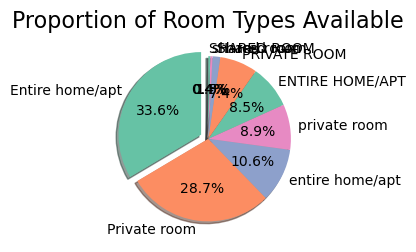

In [38]:
#13.
plt.figure(figsize=(4, 4))
colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3']
plt.pie(
    room_type, 
    labels=room_type.index, 
    autopct='%1.1f%%',  
    startangle=90,      
    colors=colors,      
    explode=[0.1 if i == 0 else 0 for i in range(len(room_type))],  
    shadow=True       
)
plt.title('Proportion of Room Types Available', fontsize=16)
plt.tight_layout()
plt.show()

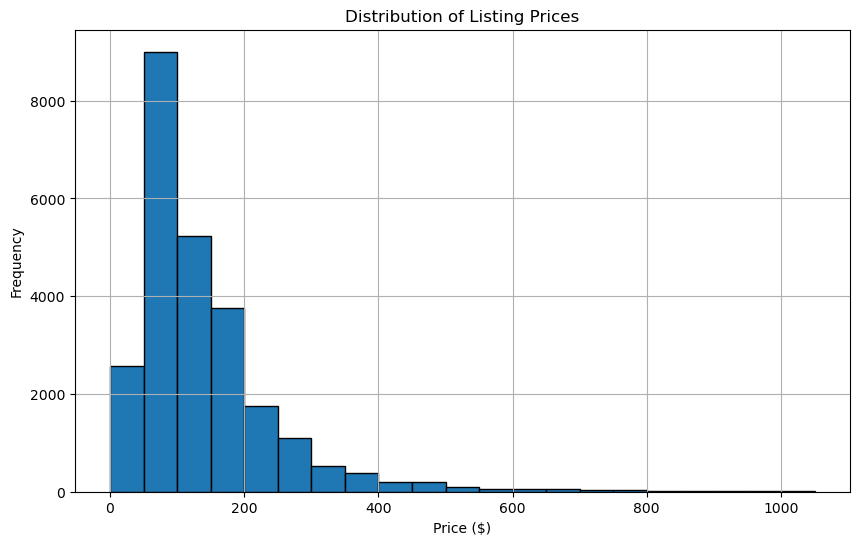

In [39]:
#14.
plt.figure(figsize=(10, 6))
plt.hist(df_price['price'], bins=range(0, 1100, 50), edgecolor='black')  # Bins in increments of 50
plt.title('Distribution of Listing Prices')
plt.xlabel('Price ($)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

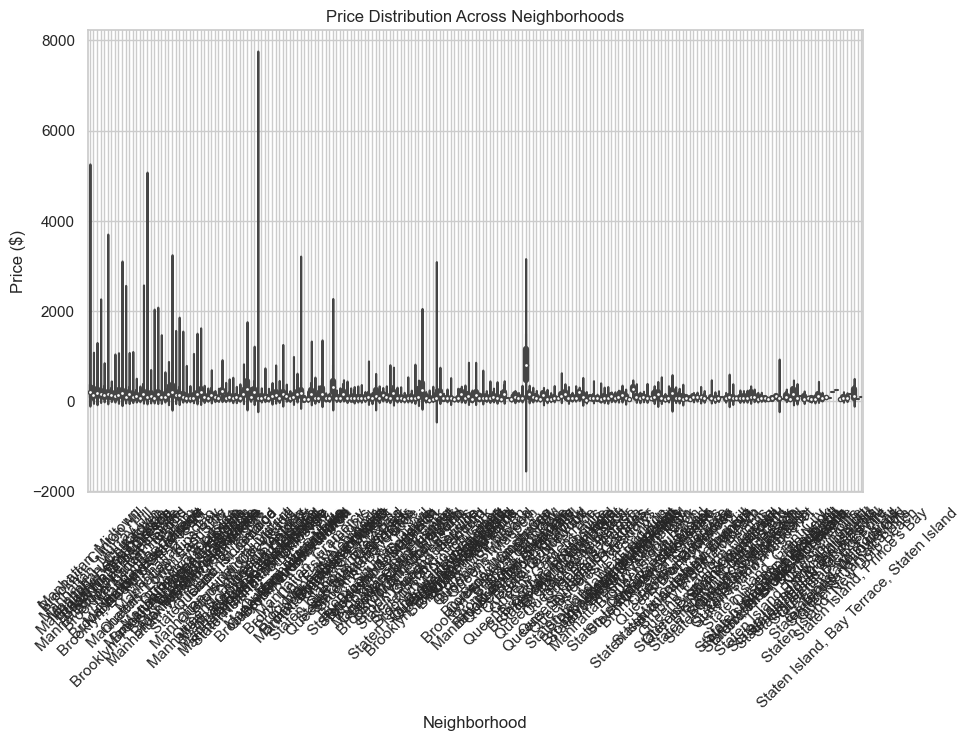

In [41]:
#15.

df=pd.DataFrame({"neighbourhood":df_price['nbhood_full'],
                "price":df_price['price']})
# Set Seaborn style
sns.set(style="whitegrid")

# Create the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='neighbourhood', y='price', data=df)

# Customize the plot
plt.title('Price Distribution Across Neighborhoods')
plt.xlabel('Neighborhood')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)  
plt.grid(True)


plt.show()

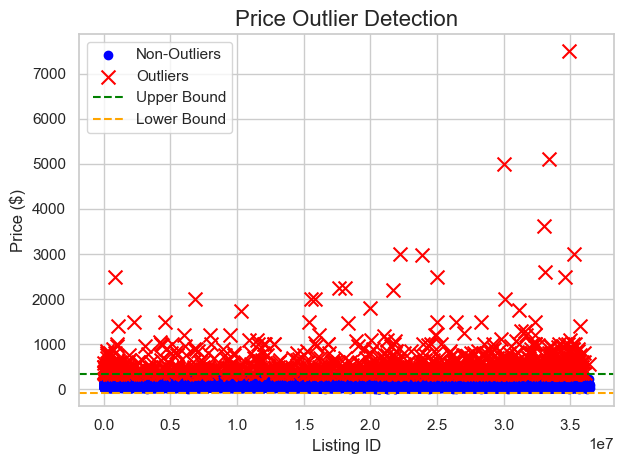

In [42]:
#Bonus questions
df_price['price'] = pd.to_numeric(df_price['price'], errors='coerce')
Q1 = df_price['price'].quantile(0.25)  
Q3 = df_price['price'].quantile(0.75)  
IQR = Q3 - Q1 
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = df_price[df_price['price'] > upper_bound]
non_outliers = df_price[df_price['price'] <= upper_bound]

plt.scatter(non_outliers['listing_id'], non_outliers['price'], 
            color='blue', label='Non-Outliers')


plt.scatter(outliers['listing_id'], outliers['price'], 
            color='red', label='Outliers', marker='x', s=100)

plt.title('Price Outlier Detection', fontsize=16)
plt.xlabel('Listing ID', fontsize=12)
plt.ylabel('Price ($)', fontsize=12)
plt.axhline(upper_bound, color='green', linestyle='--', label='Upper Bound')
plt.axhline(lower_bound, color='orange', linestyle='--', label='Lower Bound')
plt.legend()
plt.tight_layout()
plt.show()

In [43]:
import plotly.express as px
gp=pd.DataFrame({"price":df_price['price'],
                 "neighbourhood":df_price['nbhood_full'],
                 "room_type":df_room['room_type'],
                 "description":df_room['description']})

In [44]:
fig = px.scatter(
    gp,
    x='price',  # Neighborhoods on x-axis
    y='neighbourhood',         # Prices on y-axis
    color='room_type', # Different colors for each room type
    size='price',      # Bubble size represents price
    hover_data=['description', 'room_type'],  # Tooltip info
    title='Interactive Visualization: Price Trends by Neighborhood',
    labels={'price': 'Price ($)', 'neighbourhood': 'neighbourhood'},
    template='plotly_dark'  # Optional: Dark theme for better visuals
)
fig.update_traces(marker=dict(opacity=0.8, line=dict(width=1, color='DarkSlateGray')))
fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend_title_text='Room Type'
)
fig.show()